In [1]:
import tensorflow.keras
tensorflow.keras.__version__

'2.5.0'

In [2]:
from tensorflow.keras.models import load_model
model = load_model('cats_and_dogs_small_2.h5')
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_12 (Conv2D)           (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 15, 15, 128)      

In [3]:
img_path = 'datasets/cats_and_dogs_small/test/cats/cat.1700.jpg'

from tensorflow.keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150,150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)

img_tensor /= 255.

print(img_tensor.shape)

(1, 150, 150, 3)


In [4]:
import matplotlib.pyplot as plt

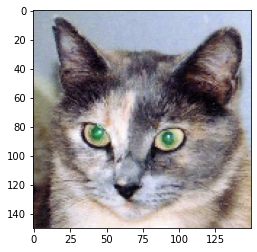

In [5]:
plt.imshow(img_tensor[0])
plt.show()

In [6]:
from tensorflow.keras import models

layer_outputs = [layer.output for layer in model.layers[:8]]

activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

In [7]:
activations = activation_model.predict(img_tensor)

In [8]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 148, 148, 32)


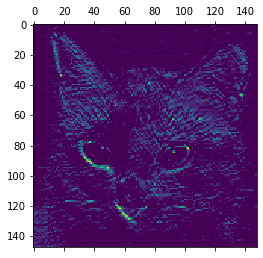

In [9]:
plt.matshow(first_layer_activation[0, :, :, 0], cmap='viridis')
plt.show()

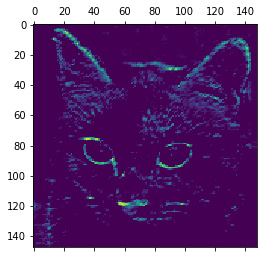

In [10]:
plt.matshow(first_layer_activation[0, :, :, 4], cmap='viridis')
plt.show()

C:\Users\zxwlg\AppData\Local\Temp/ipykernel_12152/3505488998.py:19: RuntimeWarning: invalid value encountered in true_divide
  channel_image /= channel_image.std()


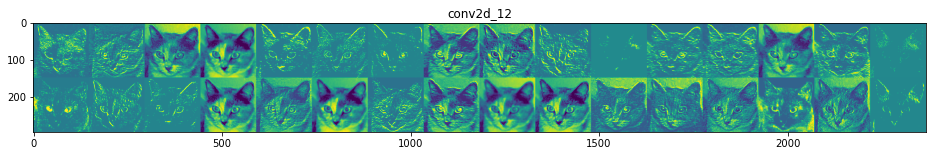

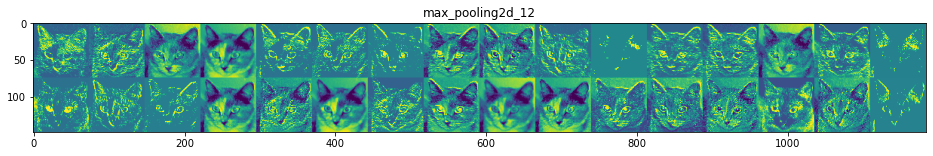

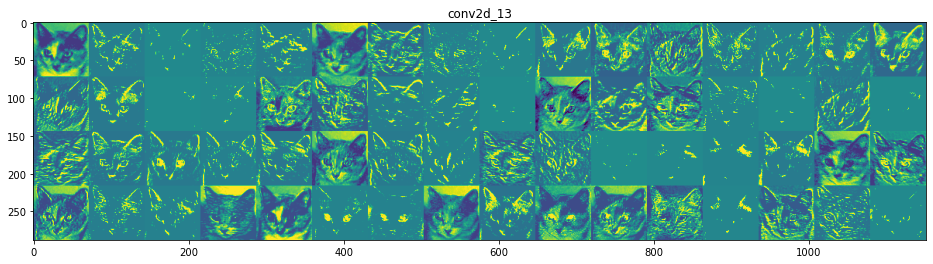

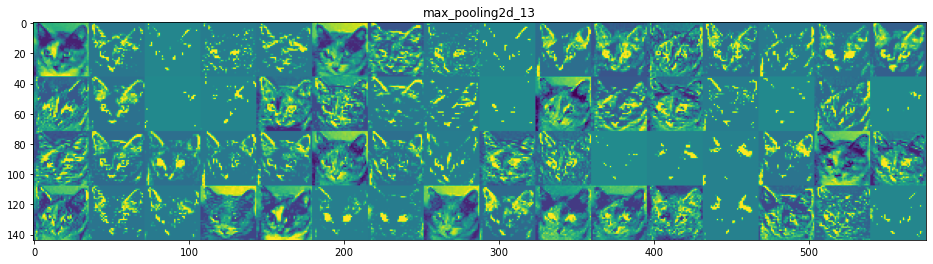

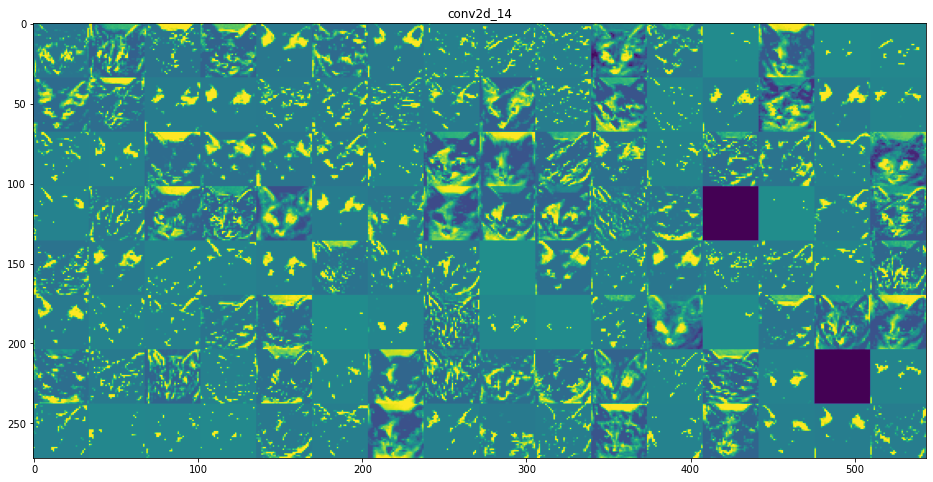

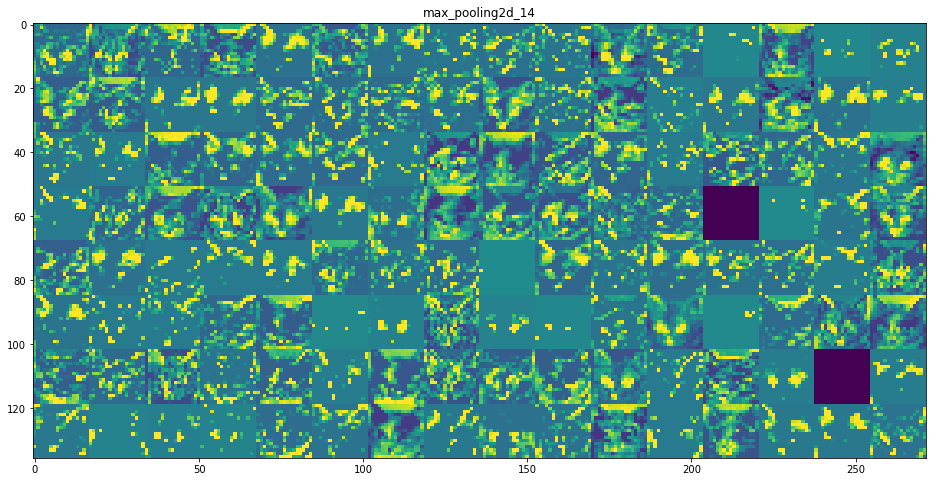

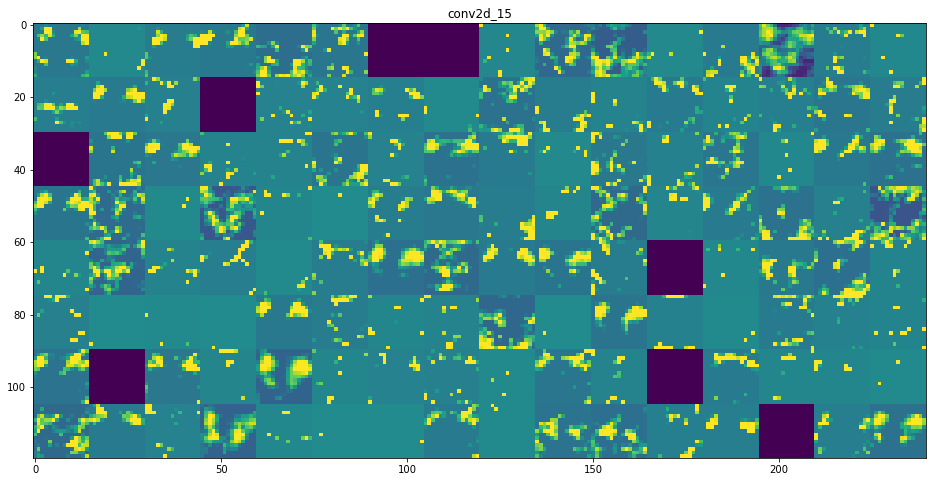

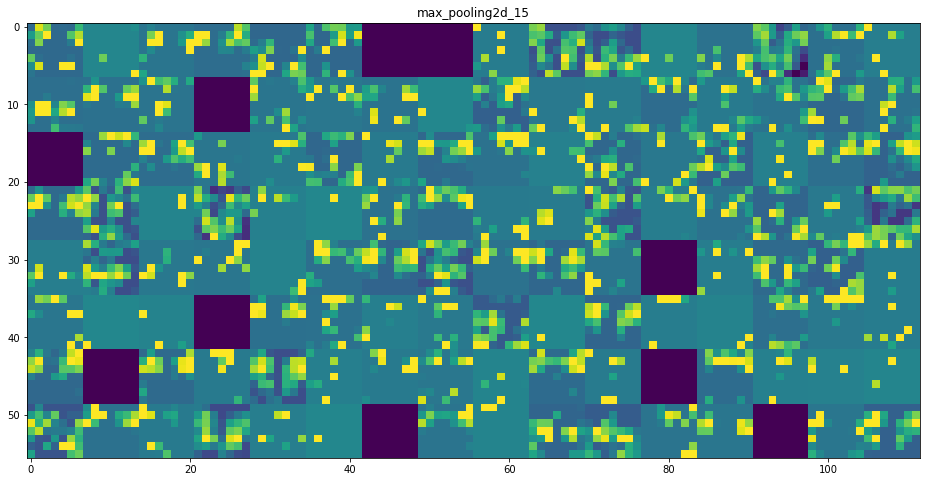

In [11]:
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]

    size = layer_activation.shape[1]

    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0, :, :, col * images_per_row + row]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,\
                         row * size : (row + 1) * size] = channel_image
    scale = 1./size
    plt.figure(figsize=(scale * display_grid.shape[1],\
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
plt.show()

In [12]:
activations[0]

array([[[[ 96.68012 ,  99.19187 , 178.8667  , ...,  81.52259 ,
          152.04308 , 118.11167 ],
         [ 96.68012 , 106.25736 , 182.6317  , ...,  81.52259 ,
          163.4607  , 118.11167 ],
         [ 96.68012 ,  86.49718 , 187.41467 , ...,  81.52259 ,
          162.89407 , 118.11167 ],
         ...,
         [ 96.68012 , 129.15909 , 238.87207 , ...,  81.52259 ,
          209.59872 , 118.11167 ],
         [ 96.68012 , 117.71956 , 247.08974 , ...,  81.52259 ,
          210.7644  , 118.11167 ],
         [ 96.68012 , 111.56951 , 248.1414  , ...,  81.52259 ,
          207.13968 , 118.11167 ]],

        [[ 96.68012 , 126.67258 , 179.50024 , ...,  81.52259 ,
          155.86523 , 118.11167 ],
         [ 96.68012 , 128.60793 , 184.46416 , ...,  81.52259 ,
          171.18896 , 118.11167 ],
         [ 96.68012 , 102.85511 , 179.5826  , ...,  81.52259 ,
          145.0535  , 118.11167 ],
         ...,
         [ 96.68012 , 110.24625 , 242.92108 , ...,  81.52259 ,
          208.2518  , 118

In [13]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras import backend as K
import tensorflow as tf
tf.compat.v1.disable_eager_execution()


model = VGG16(weights='imagenet', include_top=False)

layer_name = 'block3_conv1'
filter_index = 0

layer_output = model.get_layer(layer_name).output
loss = K.mean(layer_output[:, :, :, filter_index])

In [14]:
grads = K.gradients(loss, model.input)[0]

In [15]:
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

In [16]:
iterate = K.function([model.input], [loss, grads])
# test
import numpy as np
loss_value, grads_value = iterate([np.zeros((1, 150, 150, 3))])

In [17]:
input_img_data = np.random.random((1, 150, 150, 3)) * 20 + 128.

step = 1.
for i in range(40):
    loss_value, grads_value = iterate([input_img_data])
    input_img_data += grads_value * step

In [18]:
def deprocess_image(x):
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    x += 0.5
    x = np.clip(x, 0, 1)

    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [19]:
def generate_pattern(layer_name, filter_index, size=150):
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])

    grads = K.gradients(loss, model.input)[0]

    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    iterate = K.function([model.input], [loss, grads])

    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.

    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
    img = input_img_data[0]
    return deprocess_image(img)

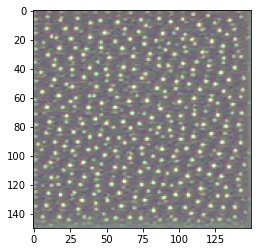

In [20]:
plt.imshow(generate_pattern('block3_conv1', 0))
plt.show()

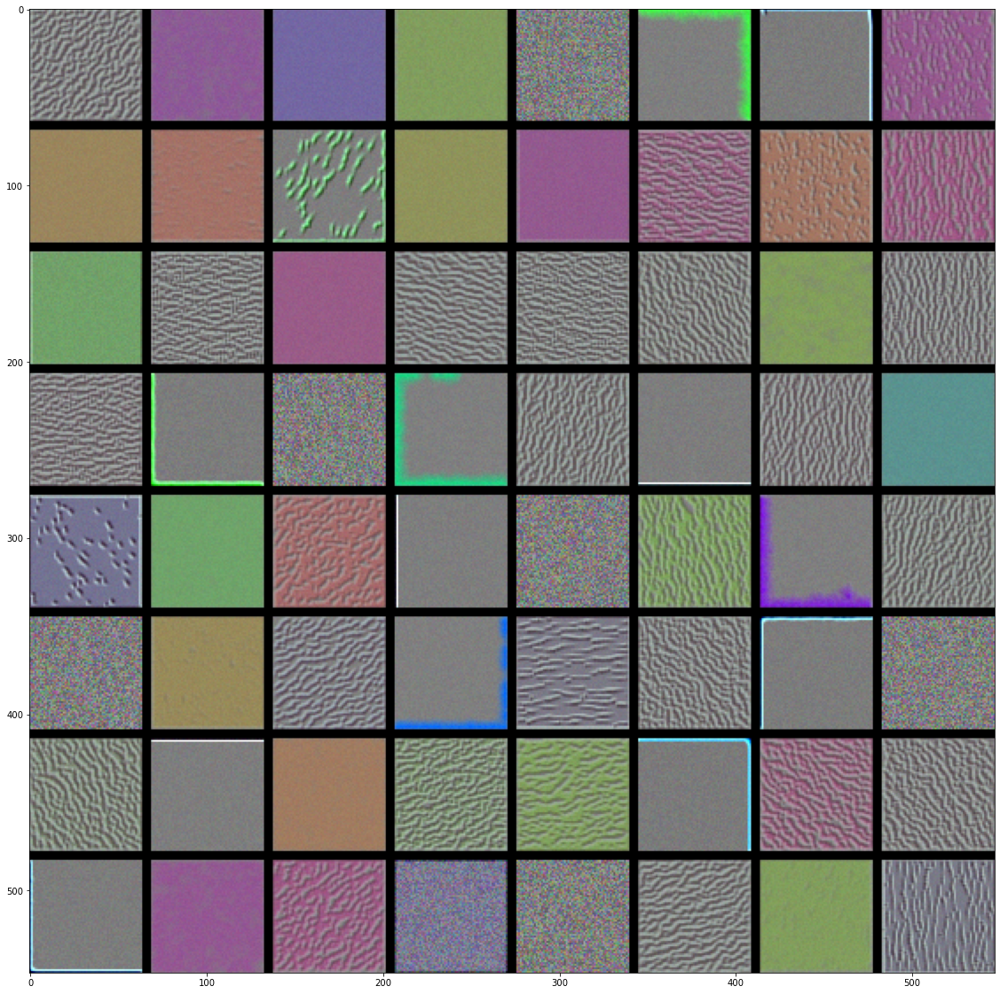

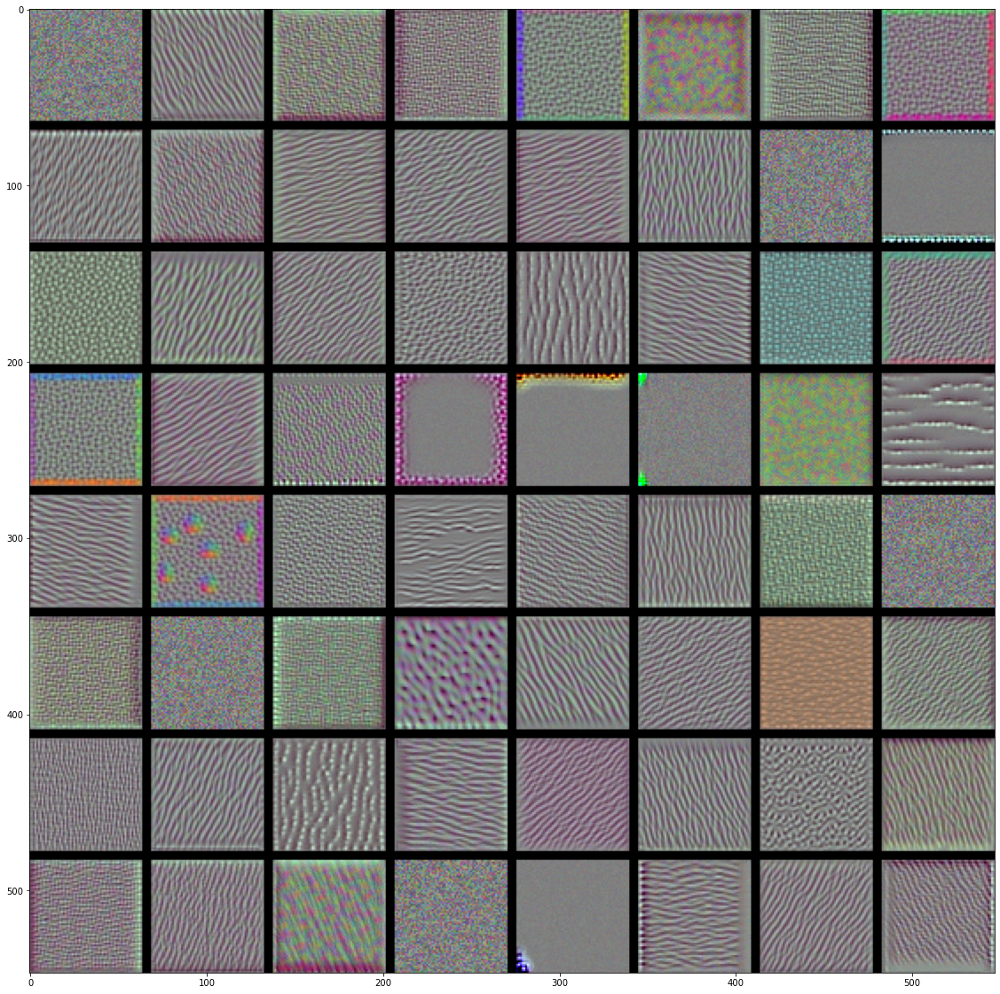

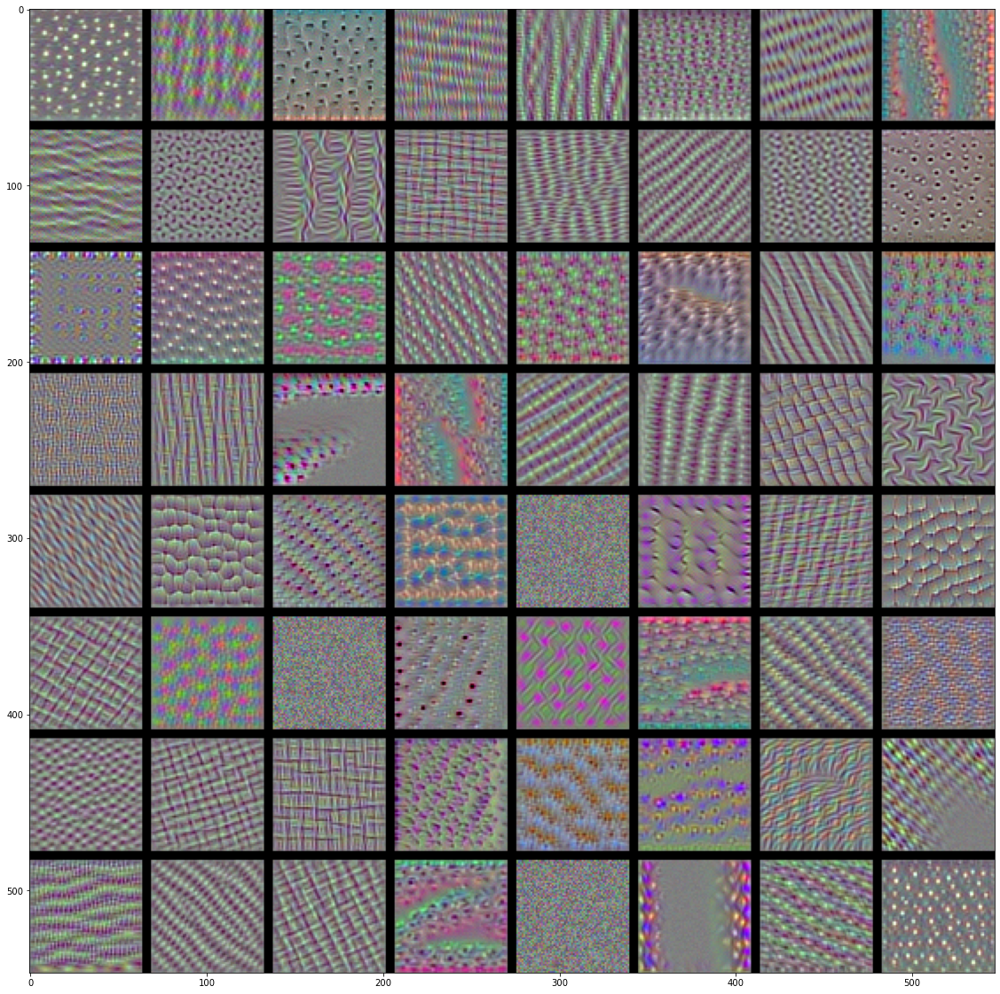

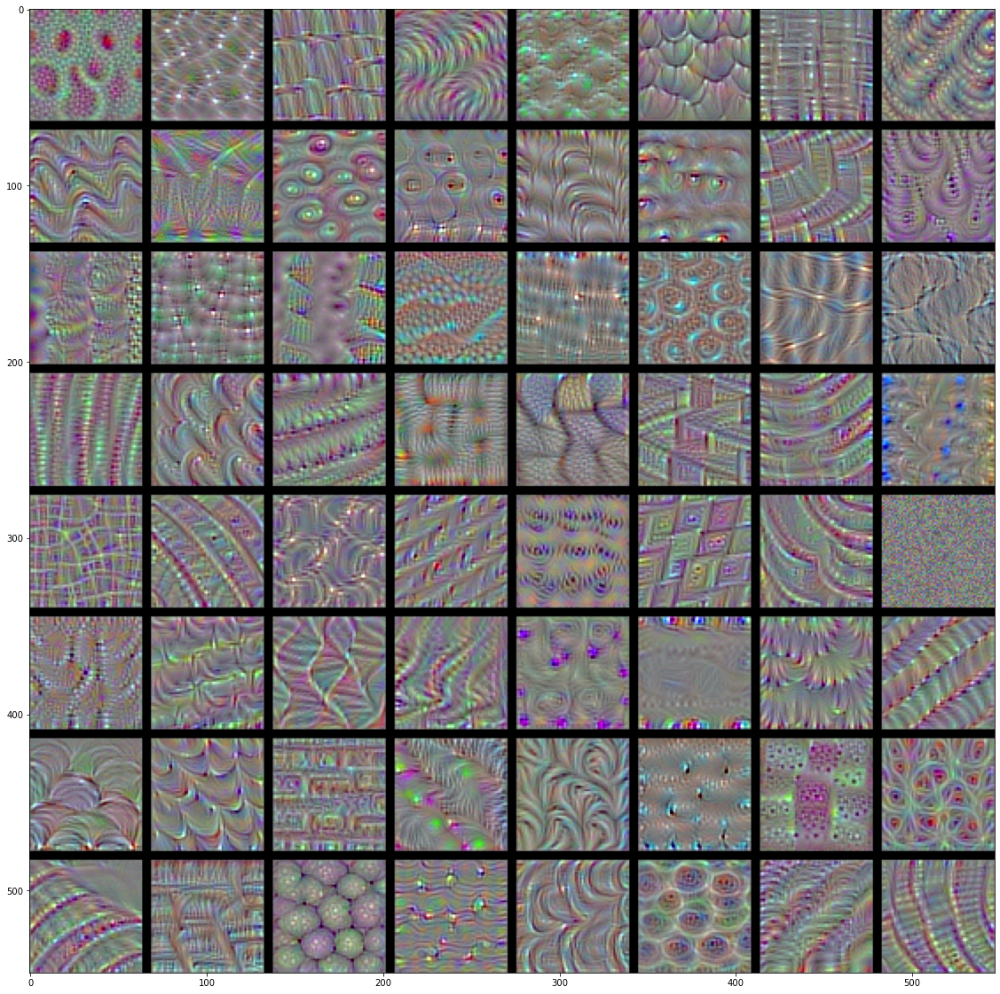

In [21]:
for layer_name in ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1']:
    size = 64
    margin = 5

    results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3), dtype='uint8')

    for i in range(8):
        for j in range(8):
            filter_img = generate_pattern(layer_name, i + (j * 8), size=size)

            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start : horizontal_end, vertical_start: vertical_end, :] = filter_img
    
    plt.figure(figsize=(20,20))
    plt.imshow(results)
    plt.show()

In [22]:
K.clear_session()

model = VGG16(weights='imagenet')

In [23]:
model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [24]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np

img_path = 'datasets/elephant.jpg'

img = image.load_img(img_path, target_size=(224, 224))

x = image.img_to_array(img)

x = np.expand_dims(x, axis=0)

x = preprocess_input(x)

In [25]:
preds = model.predict(x)
print(f'Predicted: {decode_predictions(preds, top=3)[0]}')

C:\Users\zxwlg\miniconda3\envs\dl\lib\site-packages\tensorflow\python\keras\engine\training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


Predicted: [('n02504458', 'African_elephant', 0.90943694), ('n01871265', 'tusker', 0.086167134), ('n02504013', 'Indian_elephant', 0.0043545836)]


In [26]:
np.argmax(preds[0])

386

In [27]:
african_elephant_output = model.output[:, 386]

last_conv_layer = model.get_layer('block5_conv3')

grads = K.gradients(african_elephant_output, last_conv_layer.output)[0]

pooled_grads = K.mean(grads, axis=(0,1,2))

iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([x])

for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

heatmap = np.mean(conv_layer_output_value, axis=-1)

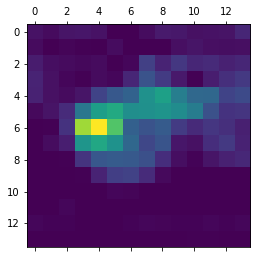

In [28]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

In [29]:
import cv2

img = cv2.imread(img_path)

heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

heatmap = np.uint8(255 * heatmap)

heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

superimposed_img = heatmap * 0.4 + img

cv2.imwrite('datasets/elephant_cam.jpg', superimposed_img)

True

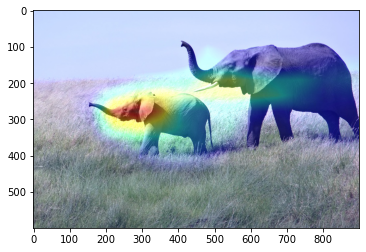

In [30]:
img2 = cv2.imread('datasets/elephant_cam.jpg')

plt.imshow(img2[:, :, ::-1])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


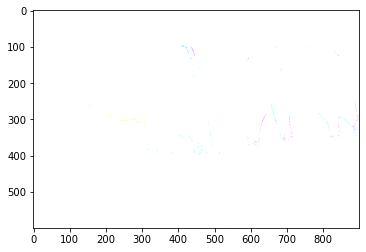

In [31]:
plt.imshow(superimposed_img[:, :, ::-1])

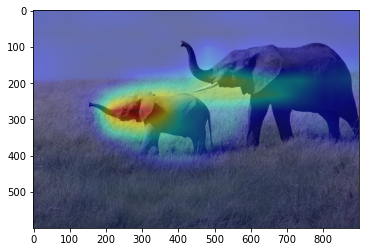

In [32]:
img3 = cv2.addWeighted(heatmap, 0.4, img, 0.5, 0)
plt.imshow(img3[:, :, ::-1])

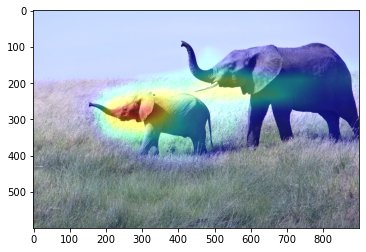

In [34]:
img4 = np.clip(superimposed_img, 0, 255).astype(np.uint8)
plt.imshow(img4[:, :, ::-1])